# Week 3

In [1]:
# Own Libraries
from utils.plotting import plot_image_and_similar
from utils.data import DataManager
from utils.metrics import prec_recall, iou_score, f1_dice
from utils.similarity import Similarity
from utils.image_processing import image_to_windows, get_3d_norm_histogram, calculate_histograms,text_removal
from utils.image_processing import calculate_histograms, text_removal, calculate_hog, calculate_lbp
from utils.segbackground import NMS, background_crop
# 3rd Party Libraries
from skimage.io import imread
from skimage.color import rgb2gray
from typing import Tuple, List
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import pickle
import ml_metrics as metrics
from scipy.ndimage import gaussian_filter
import math

In [2]:
def readimg (path):
    return cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)

# Load Data

In [3]:
!ls data/

BBDD	 qsd1_w2  qsd2_w1  qsd2_w3  qst2_w1  readme
qsd1_w1  qsd1_w3  qsd2_w2  qst1_w2  qst2_w2


In [4]:
# Load Data
data_manager = DataManager()
db, db_files = data_manager.load_data(folder = "./data/BBDD/", extension = ".jpg", desc = "Loading BBDD Data...")

qsd1_w2, qsd1_w2_files = data_manager.load_data(folder = "./data/qsd1_w2/", extension = ".jpg", desc = "Loading qsd1_w2 Data...")
qsd1_w3, qsd1_w3_files = data_manager.load_data(folder = "./data/qsd1_w3/", extension = ".jpg", desc = "Loading qsd1_w3 Data...")
qsd2_w3, qsd2_w3_files = data_manager.load_data(folder = "./data/qsd2_w3/", extension = ".jpg", desc = "Loading qsd2_w3 Data...")

Loading BBDD Data...: 100%|████████████████████████████████████████| 287/287 [00:04<00:00, 67.43it/s]


./data/BBDD/ read: 287 images


Loading qsd1_w2 Data...: 100%|██████████████████████████████████████| 30/30 [00:00<00:00, 334.16it/s]


./data/qsd1_w2/ read: 30 images


Loading qsd1_w3 Data...: 100%|█████████████████████████████████████| 30/30 [00:00<00:00, 1194.35it/s]


./data/qsd1_w3/ read: 30 images


Loading qsd2_w3 Data...: 100%|██████████████████████████████████████| 30/30 [00:00<00:00, 217.32it/s]


./data/qsd2_w3/ read: 30 images


This week we use mainly:
- QSD1-W3 (30) / QST1-W3 (50)  cropped pictures with overlapping text (name of painter), one painting per image, some paintings with noise, some paintings with changes in color

- QSD2-W3 (30) / QST2-W3 (30)  pictures with background and text and in some cases more than one picture per image, some paintings with noise, some paintings with changes in color

In [8]:
qsd1_w3_files[:5]

('./data/qsd1_w3/00000.jpg',
 './data/qsd1_w3/00001.jpg',
 './data/qsd1_w3/00002.jpg',
 './data/qsd1_w3/00003.jpg',
 './data/qsd1_w3/00004.jpg')

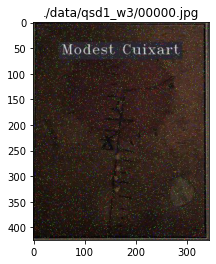

In [9]:
for img, filename in zip(qsd1_w3, qsd1_w3_files):
    plt.imshow(img)
    plt.title(filename)
    break # show only 1 image

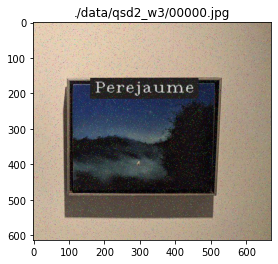

In [10]:
for img, filename in zip(qsd2_w3, qsd2_w3_files):
    plt.imshow(img)
    plt.title(filename)
    break # show only 1 image

## Preprocessing: Noise Reduction

In [11]:
# low pass filter
(lpfw,lpfh) = (3,3)
lowPassFilter = np.ones((lpfw,lpfh))*1/(lpfw*lpfh)

# high pass filter
(hpfw,hpfh) = (3,3)
highPassFilter = -1*np.ones((hpfw,hpfh))
highPassFilter[hpfw//2,hpfh//2] = -np.sum(highPassFilter)-1

# gaussian filter
def gfunc(x,y,sigma):
    return (math.exp(-(x**2 + y**2)/(2*(sigma**2))))/(2*3.14*(sigma**2))

def gaussFilter(size, sigma):
    out = np.zeros(size)
    for i in range(size[0]):
        for j in range(size[1]):
            out[i,j] = gfunc(i-size[0]//2,j-size[1]//2, sigma )
    return out/np.sum(out)

(gfw,gfh) = (3,3)
gaussianFilter = gaussFilter((gfw,gfh),1)

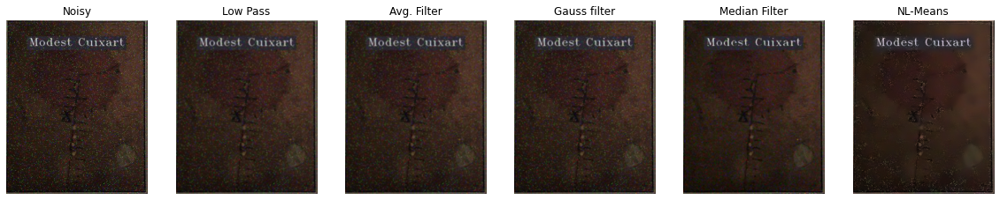

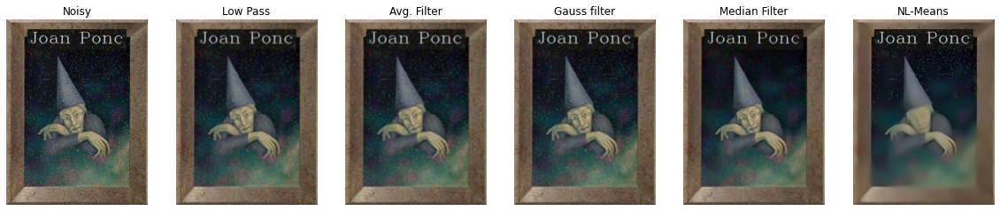

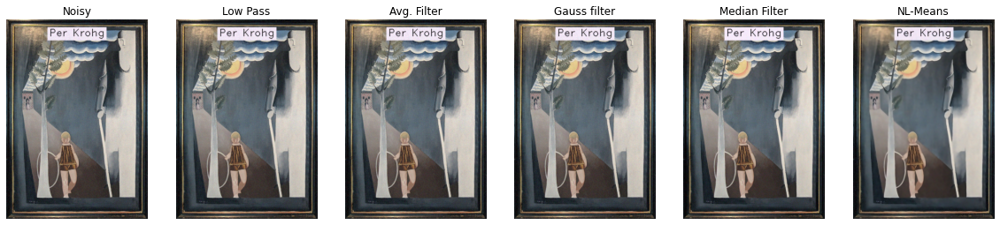

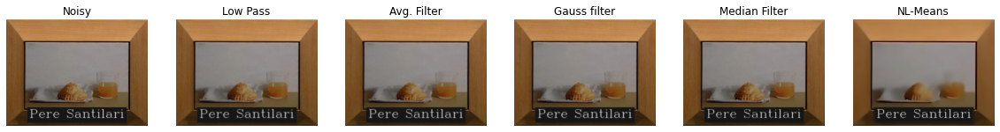

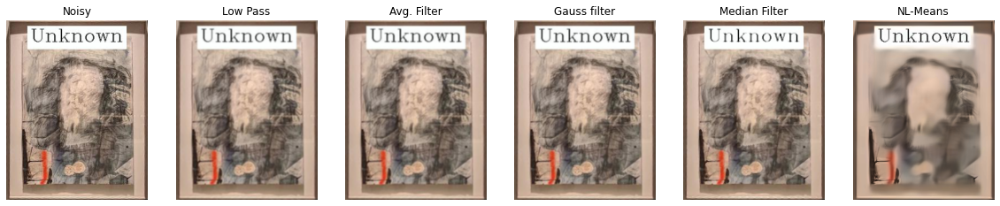

In [12]:
for img, filename in zip(qsd1_w3[:5], qsd1_w3_files[:5]):
    
    ksize = (3,3)
    
    (lpfw,lpfh) = ksize
    lowPassFilter = np.ones((lpfw,lpfh))*1/(lpfw*lpfh)
    low_img = cv2.filter2D(img,-1,lowPassFilter)

    (gfw,gfh) = ksize
    gaussianFilter = gaussFilter((gfw,gfh),1)
    gaussian_image = cv2.filter2D(img,-1,gaussianFilter)
    
    avg_img = cv2.blur(img,ksize)
    gblur_img = cv2.GaussianBlur(img,ksize,0)
    median = cv2.medianBlur(img,3)
    
    nlmeans = cv2.fastNlMeansDenoisingColored(img, None, 15, 15, 13, 21)
    
    f, axarr = plt.subplots(1,6, figsize=(20,20))
    axarr[0].imshow(img)
    axarr[0].title.set_text("Noisy")
    axarr[0].axis('off')
    axarr[1].imshow(low_img)
    axarr[1].title.set_text("Low Pass")
    axarr[1].axis('off')
    axarr[2].imshow(avg_img)
    axarr[2].title.set_text("Avg. Filter")
    axarr[2].axis('off')
    axarr[3].imshow(gblur_img)
    axarr[3].title.set_text("Gauss filter")
    axarr[3].axis('off')
    axarr[4].imshow(median)
    axarr[4].title.set_text("Median Filter")
    axarr[4].axis('off')
    axarr[5].imshow(nlmeans)
    axarr[5].title.set_text("NL-Means")
    axarr[5].axis('off')
    
    plt.show()

In [13]:
def denoise_images (images, method='nlmeans', ksize=(3,3)):
    
    ksize = ksize
    
    (lpfw,lpfh) = ksize
    (gfw,gfh) = ksize
    
    new_images = []
    for img in tqdm(images):
        
        if method == 'low_pass':
            lowPassFilter = np.ones((lpfw,lpfh))*1/(lpfw*lpfh)
            denoised_img = cv2.filter2D(img,-1,lowPassFilter)
        elif method == 'gauss':
            #gaussianFilter = gaussFilter((gfw,gfh),1)
            #gaussian_image = cv2.filter2D(img,-1,gaussianFilter)
            denoised_img = cv2.GaussianBlur(img,ksize,0)

        elif method == 'average':
            denoised_img = cv2.blur(img,ksize)
        
        elif method == 'nlmeans':
            denoised_img = cv2.fastNlMeansDenoisingColored(img, None, 15, 15, 13, 21)
            
        elif method == 'median':
            denoised_img = cv2.medianBlur(img,ksize[0])
        else:
            return None 
        
        new_images.append(denoised_img)
        
    return new_images

In [14]:
DENOISE = False

if DENOISE:
    
    qsd1_w3 = denoise_images (qsd1_w3,method='nlmeans', ksize=(3,3))
    qsd2_w3 = denoise_images (qsd2_w3,method='nlmeans', ksize=(3,3))

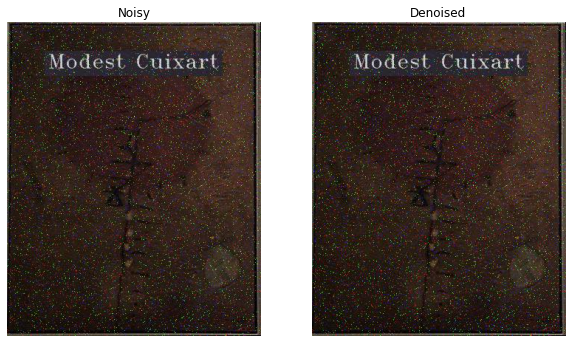

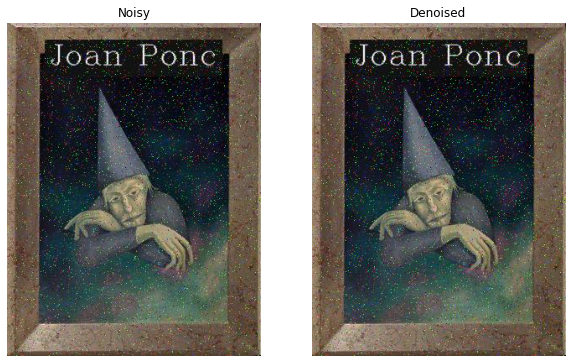

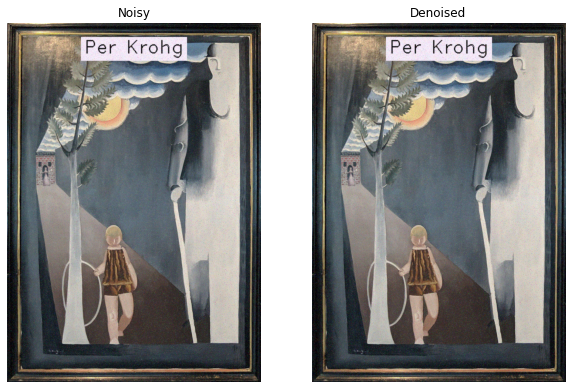

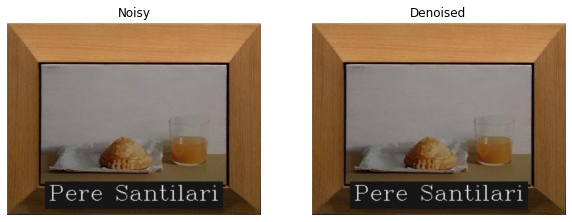

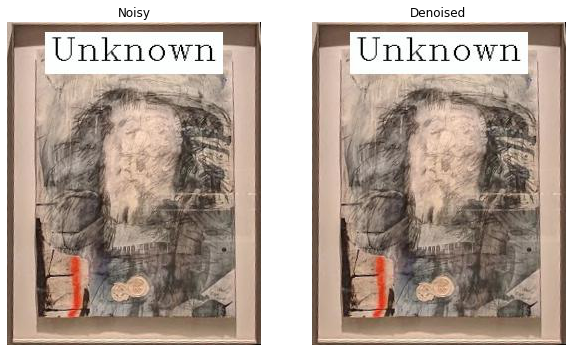

...

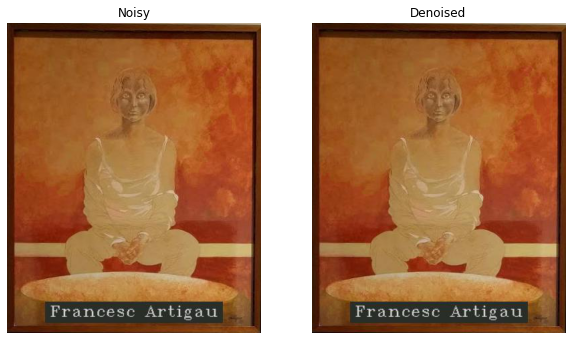

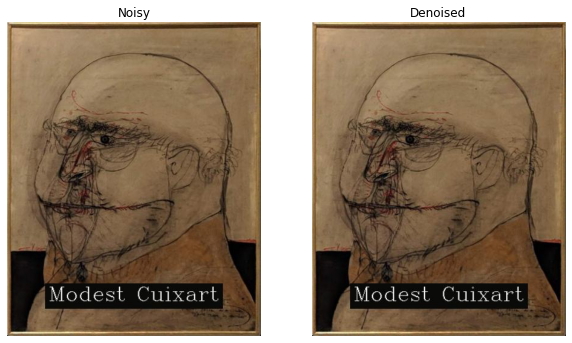

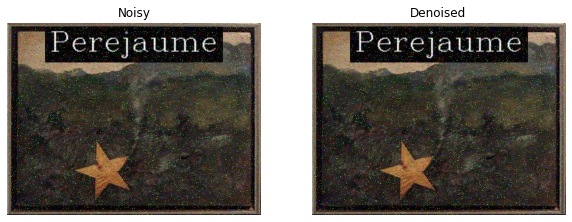

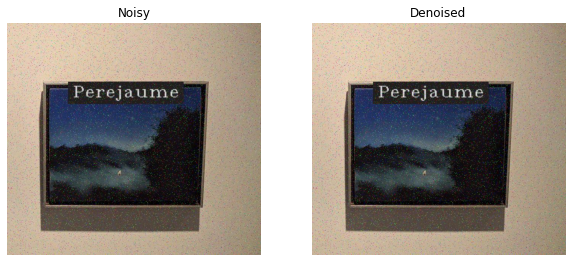

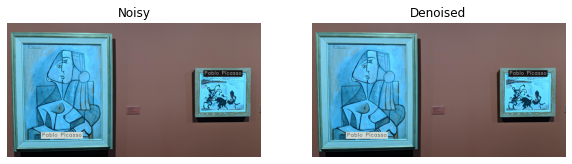

In [15]:
for den_img, filename in zip(qsd1_w3, qsd1_w3_files):
    
    img = readimg(filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(img)
    axarr[0].title.set_text("Noisy")
    axarr[0].axis('off')
    axarr[1].imshow(den_img)
    axarr[1].title.set_text("Denoised")
    axarr[1].axis('off')
    plt.show()
    
for den_img, filename in zip(qsd2_w3[:2], qsd2_w3_files[:2]):
    
    img = readimg(filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(img)
    axarr[0].title.set_text("Noisy")
    axarr[0].axis('off')
    axarr[1].imshow(den_img)
    axarr[1].title.set_text("Denoised")
    axarr[1].axis('off')
    plt.show()

## Step 1) Crop, background removal and obtain the pictures.

In [19]:
DO_BKGCROP = True

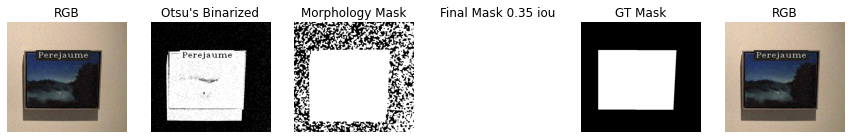

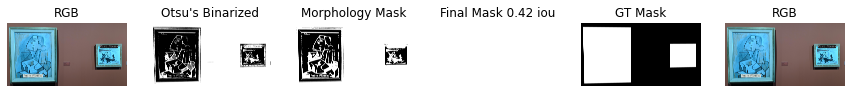

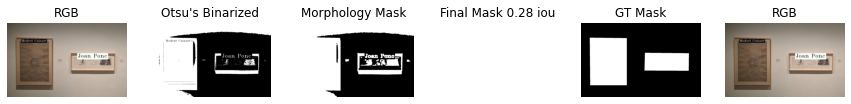

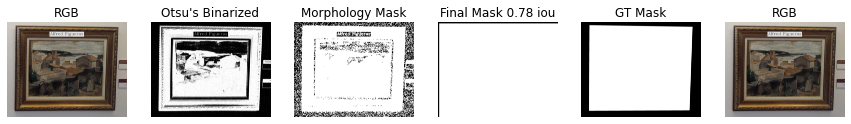

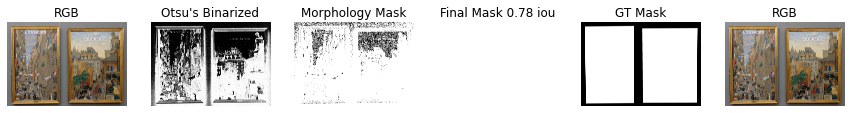

...

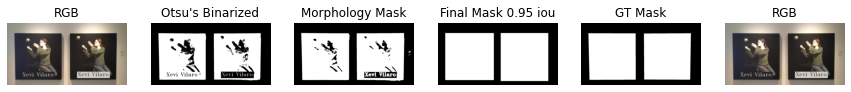

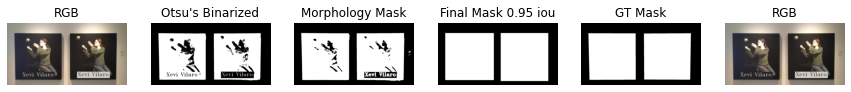

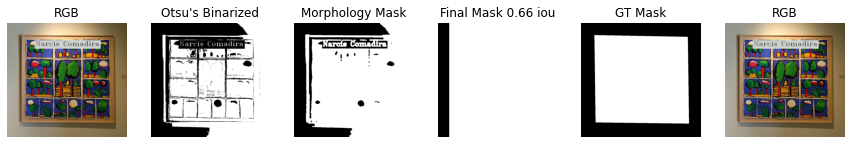

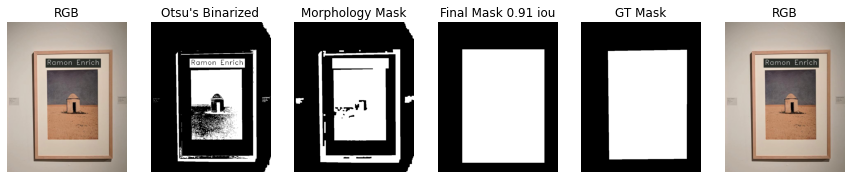

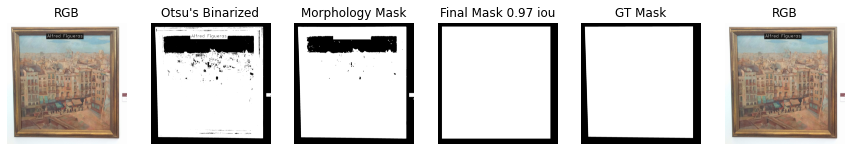


>> Mean IOU Score:  0.7741807736691273


In [25]:
if DO_BKGCROP:
    qsd2_w3, qsd2_w3_files = background_crop (files= qsd2_w3_files, gt_masks= True, save_masks = False, plot_results=True)

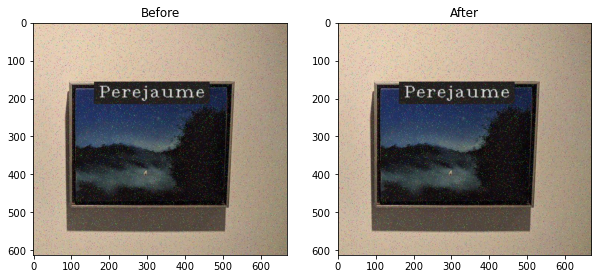

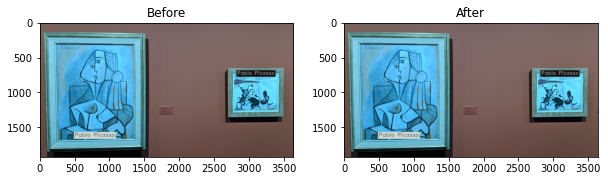

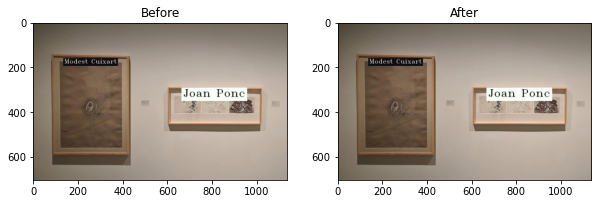

In [26]:
for img, filename in zip(qsd2_w3[:3], qsd2_w3_files[:3]):
    base = readimg (filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(base)
    axarr[0].title.set_text("Before")
    axarr[1].imshow(img)
    axarr[1].title.set_text("After")
    plt.show()

## Step 2) Text Removal using crops

In [27]:
DO_TEXT_REMOVAL = False

In [28]:
#Method to remove text from the image with a rectangle 0 mask
if DO_TEXT_REMOVAL:
    qsd1_w3,contours = text_removal(qsd1_w3,num_images= 1,desc = 'Removing text of images') 
    #qsd2_w2,contours = text_removal(qsd2_w2,num_images= 1,desc = 'Removing text of images') 

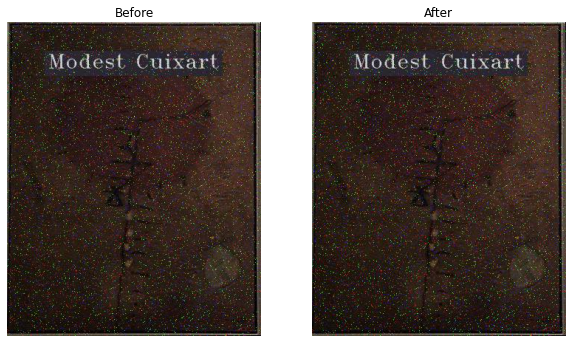

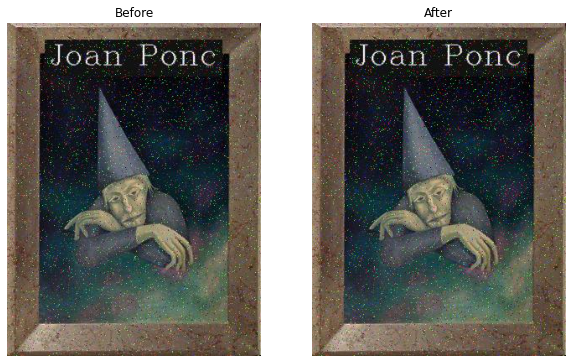

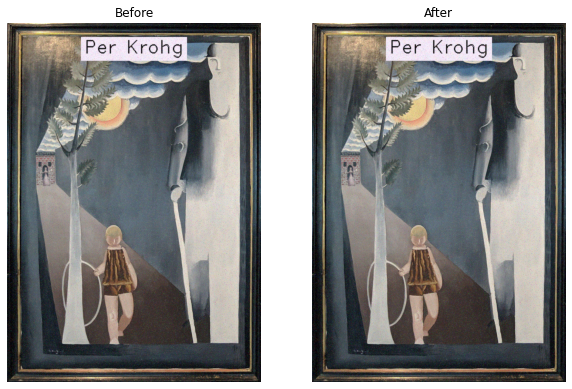

In [29]:
for img, filename in zip(qsd1_w3[:3], qsd1_w3_files[:3]):
    base = readimg (filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(base)
    axarr[0].title.set_text("Before")
    axarr[0].axis('off')
    axarr[1].imshow(img)
    axarr[1].title.set_text("After")
    axarr[1].axis('off')
    plt.show()

## Step 3) Feature extraction

In [ ]:
NBINS = 16
NCOLS = 8
NROWS = 8
BLOCK = True

COLOR
TEXTURE = True

In [ ]:
# 3D Normalized Histograms Multiresolutio/Block Images

if COLOR:
    db_feature_matrix = calculate_histograms(data = db, n_bins = NBINS, n_rows=NROWS, n_cols=NCOLS, desc="Normalized 3D Histograms Calculation for BBDD...")
    qsd1_w2_feature_matrix = calculate_histograms(data = qsd1_w2, n_bins = NBINS, n_rows=NROWS, n_cols=NCOLS, desc = "Normalized 3D Histograms Calculation for qsd1_w2...")
    qsd1_w3_feature_matrix = calculate_histograms(data = qsd1_w3, n_bins = NBINS, n_rows=NROWS, n_cols=NCOLS, desc = "Normalized 3D Histograms Calculation for qsd1_w3...")
    qsd2_w3_feature_matrix = calculate_histograms(data = qsd2_w3, n_bins = NBINS, n_rows=NROWS, n_cols=NCOLS, desc = "Normalized 3D Histograms Calculation for qsd1_w3...")
    
if TEXTURE:
    # HoG @  32s
    db_feature_matrix = calculate_hog(data = db, desc="Histogram of Gradient (HoG) for BBDD...")

    qsd1_w2_feature_matrix = calculate_hog(data = qsd1_w2, desc = "Histogram of Gradient (HoG) for qsd1_w2...")
    qsd1_w3_feature_matrix = calculate_hog(data = qsd1_w3, desc = "Histogram of Gradient (HoG) for qsd1_w2...")
    qsd2_w3_feature_matrix = calculate_hog(data = qsd2_w3, desc = "Histogram of Gradient (HoG) for qsd2_w3...")


In [ ]:
print (f'For each of the {qsd1_w3_feature_matrix.shape[0]} images, we have a {qsd1_w3_feature_matrix.shape[1]} dimensional descriptor')

In [ ]:
# Similarity
sim = Similarity()
qs1_w2_similarities  = sim.compute_similarities(qs = qsd1_w2_feature_matrix, db_feature_matrix = db_feature_matrix, desc = "Computing qsd1_w2 similarities...", similarity = 'hellinger')
qs1_w3_similarities  = sim.compute_similarities(qs = qsd1_w3_feature_matrix, db_feature_matrix = db_feature_matrix, desc = "Computing qsd1_w3 similarities...", similarity = 'hellinger')
qs2_w3_similarities  = sim.compute_similarities(qs = qsd2_w3_feature_matrix, db_feature_matrix = db_feature_matrix, desc = "Computing qsd1_w3 similarities...", similarity = 'hellinger')

In [ ]:
# Get top K
K = 10

top_k_qsd1_w2 = sim.get_top_k(similarity_matrix = qs1_w2_similarities, db_files = db_files, k=K, desc="Retrieving qsd2_w1 top K similar images...")
top_k_qsd1_w3 = sim.get_top_k(similarity_matrix = qs1_w3_similarities, db_files = db_files, k=K, desc="Retrieving qsd2_w1 top K similar images...")
top_k_qsd2_w3 = sim.get_top_k(similarity_matrix = qs2_w3_similarities, db_files = db_files, k=K, desc="Retrieving qsd2_w1 top K similar images...")

### Validation Scores

In [ ]:
SAVE_RESULTS = False
K = 10

predicted_results = data_manager.save_results_1(results = top_k_qsd1_w2, path = "./week2/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd1_w2/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

predicted_results = data_manager.save_results_1(results = top_k_qsd1_w3, path = "./week3/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd1_w3/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

predicted_results = data_manager.save_results_1(results = top_k_qsd2_w3, path = "./week3/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd2_w3/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

In [ ]:
K = 5

predicted_results = data_manager.save_results_1(results = top_k_qsd1_w2, path = "./week2/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd1_w2/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

predicted_results = data_manager.save_results_1(results = top_k_qsd1_w3, path = "./week3/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd1_w3/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

predicted_results = data_manager.save_results_1(results = top_k_qsd2_w3, path = "./week3/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd2_w3/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

In [ ]:
K = 1

predicted_results = data_manager.save_results_1(results = top_k_qsd1_w2, path = "./week2/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd1_w2/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

predicted_results = data_manager.save_results_1(results = top_k_qsd1_w3, path = "./week3/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd1_w3/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

predicted_results = data_manager.save_results_1(results = top_k_qsd2_w3, path = "./week3/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd2_w3/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

In [ ]:
plot_image_and_similar(qsd1_w3,top_k_qsd1_w3, topk=1)